In [1]:
import os

In [2]:
%run TMA_tools.ipynb


Bad key "text.kerning_factor" on line 4 in
/home/auri/anaconda3/envs/fastaiAP/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


Index(['ID', 'MMR', 'IHQ', 'BRAF', 'MLH1metCUAL', 'MUT_GERM', 'Id', 'COD_DTS',
       'BIOPSIA', 'epihosp', 'CODHOSP', 'TMA1', 'TMA2', 'TMA3', 'EDAD',
       'EPICOLON', 'SEXO', 'MLH1', 'MSH2', 'MSH6', 'PMS2', 'IMS', 'MUTACIÓN',
       'CLAS_LYNCH', 'VINCULACION 1', 'VINCULACIÓN 2', 'VINCULACIÓN 3',
       'VINCULACIÓN 4', 'SPOT_ID', 'LIST_ID', 'DERIVED_GROUP_ID',
       'Epicolon1+2IHQ-IMS-maria paper lynlike_IMS', 'LynchIMS', 'ihq_mlh1',
       'dukes_r', 'TNMagrup', 'BaseEP1y2actualizada2016-OSCAR-def_n',
       'grado_di', 'infirec', 'moc', 'edat', 'sexe', 'ccr_sin', 'aden_sin',
       'r_beth_4', 'RECIMORT', 'KRAS', 'localizacion', 'fechreci', 'ILEact',
       'estfseagrup'],
      dtype='object')
(2663, 51) (1689, 169)
number of spots 4294
number of different biopsies in spots 1774
patients in spot but not in ddbb:  31
patients in ddbb but not in spots:  217
different patients - infered from id groups  2213
different patients using COD_DTS  1889
different patients - infered from 

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [4]:

ds = pd.concat([load_dataset(0), load_dataset(1), load_dataset(2), load_dataset(3), load_dataset(4)])
#ds['tile_rot_augmentation'] = ds.tile.apply(lambda x: Spot.enlarge_tile(*x))
#ds.to_csv(f'dataset_level_all_Aug20_enlarged_no_overlap.csv')
ds.columns

/home/auri/anaconda3/envs/fastaiAP/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3254: DtypeWarning: Columns (4,5) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


Index(['tile', 'tile_rot_augmentation', 'path', 'tif_fn', 'patient_ID',
       'spot_ID', 'label'],
      dtype='object')

In [78]:
d = ds
d['zoom'] = d.tile.apply(lambda x: x[3])
zoom_filter = 2
if zoom_filter: 
    f = d.loc[d.zoom == zoom_filter]
else:
    f = d
f.patient_ID.nunique()

1674

In [79]:
def get_x(r):
    img = Spot.get_tile(Spot, *(r.tile), path=r.path, tif_name = r.tif_fn)
    
    return img

def get_y(r): #provisional as epicolon does not have masks
    
    img = Spot.get_tile(Spot, *(r.tile), path=r.path, tif_name = r.tif_fn)
    
    return img
    #return  r.label

In [80]:
calculate_stats = False
if calculate_stats:
    dls = spots_datablock.dataloaders(path, bs = 5000)
    print (dls[0].after_batch)
    bx=dls.one_batch()[0]
    print(bx.min(),bx.max(),bx.mean(dim=[0,2,3]),bx.std(dim=[0,2,3]))
    tissue_stats = (np.array(bx.mean(dim=[0,2,3]).cpu()),np.array(bx.std(dim=[0,2,3]).cpu()))
    print(tissue_stats)
else: 
    tissue_stats =  ([0.745341  , 0.49060953, 0.7466369 ], [0.17284355, 0.22938302, 0.1365517 ]) #TSR-CRC + Warwick QU
tissue_stats

([0.745341, 0.49060953, 0.7466369], [0.17284355, 0.22938302, 0.1365517])

In [81]:
segment_9_classes = True
codes = ['OTHER','NOR_E', 'TUM_E'] 
if segment_9_classes:
    codes = ['STR','NOR', 'TUM','ADI', 'BAC', 'DEB', 'LYM', 'MUC', 'MUS' ]

spots_datablock = DataBlock(blocks=(ImageBlock, MaskBlock(codes)),
                   get_x=get_x,
                   get_y=get_y,
                   splitter=RandomSplitter(),
                   batch_tfms=Normalize.from_stats(*tissue_stats))

In [82]:
dls = spots_datablock.dataloaders(f)

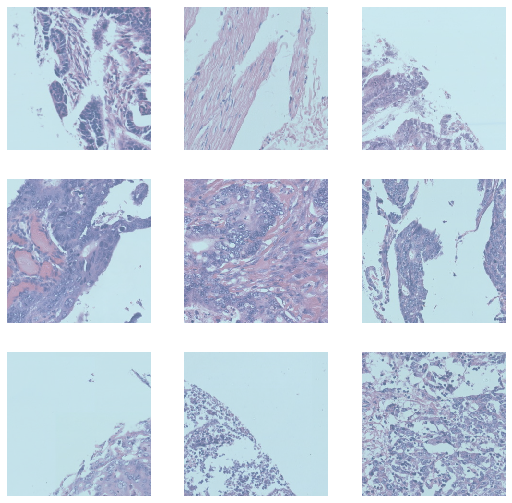

In [83]:
dls.show_batch(max_n=9)

In [84]:
bx=dls.one_batch()[0]
print(bx.min(),bx.max(),bx.mean(dim=[0,2,3]),bx.std(dim=[0,2,3]))

TensorImage(-4.5488, device='cuda:0') TensorImage(2.2207, device='cuda:0') TensorImage([-0.0808,  0.4635, -0.1293], device='cuda:0') TensorImage([1.2545, 1.2289, 1.4458], device='cuda:0')


In [85]:
def foreground_acc_9_classes(inp, targ, bkg_idx= codes.index('BAC'), axis=1): #background idx should be 4
    "Computes non-background accuracy for multiclass segmentation"
    targ = targ.squeeze(1)
    mask = targ != bkg_idx
    res = (inp.argmax(dim=axis)[mask]==targ[mask]).float().mean()
    return (inp.argmax(dim=axis)[mask]==targ[mask]).float().mean()

In [86]:
encoder = resnet34
encoder = 'tissue-classifier-9-classes'
learn = None
metric = foreground_acc
n_classes = 3
if segment_9_classes: 
    metric = foreground_acc_9_classes
    n_classes = 9
    
if encoder == resnet34:
    learn = unet_learner(dls, encoder, normalize=False,  metrics = metric)
elif encoder == 'tissue-classifier-9-classes':
    learn_pretrained = cnn_learner(dls, resnet34, metrics=[error_rate,RocAuc()],normalize=False, n_out=n_classes,
                                  path=Path("."))
    path1 = Path('models') 
    tissue_model = path1.ls()[1].with_suffix("").name #Path(str(path1.ls()[1]).replace('.pth',''))    
    learn_pretrained.load(tissue_model)
    m_tissue_classifier =  learn_pretrained.model
    m_tissue_classifier = list(m_tissue_classifier.children())[0]
    size = (300,300)
    m = DynamicUnet(m_tissue_classifier, n_classes, size, norm_type=None)
    x = torch.randn(2, 3, 300, 300)
    y = m(x)
    test_eq(y.shape, [2, n_classes, 300, 300])
    learn = Learner(dls, m, normalize=False, metrics = metric)

In [87]:
path =  Path('models')
path.ls()

(#8) [Path('models/pretrained_tissue_0.9994733308653115.pth'),Path('models/pretrained_tissue_0.9996857469905147.pth'),Path('models/segment_tissue_0.4554598927497864_f_acc_0.8807398080825806.pth'),Path('models/segment_tissue_0.3260129690170288_f_acc_0.900049090385437.pth'),Path('models/segment_tissue_presizing0.4628714621067047_f_acc_0.8756903409957886.pth'),Path('models/segment_tissue_presizing0.34281474351882935_f_acc_0.9168598055839539.pth'),Path('models/segment_tissue_9_class_2.2231385707855225_f_acc_nan.pth'),Path('models/segment_tissue_9_class.pth')]

In [88]:
tissue_model = Path(str(path.ls()[-1]).replace('.pth',''))

In [89]:
tissue_model

Path('models/segment_tissue_9_class')

In [90]:
learn.model_dir = ''
learn.load(tissue_model)

In [91]:
learn.export()

In [92]:
sample = learn.dls.test_dl(f[0:50])

In [93]:
bx=learn.dls.one_batch()[0]#.mean(dim=[0,2,3])

In [94]:
learn.dls[0].after_batch

Pipeline: IntToFloatTensor -- {'div': 255.0, 'div_mask': 1} -> Normalize -- {'mean': tensor([[[[0.7453]],

         [[0.4906]],

         [[0.7466]]]], device='cuda:0'), 'std': tensor([[[[0.1728]],

         [[0.2294]],

         [[0.1366]]]], device='cuda:0'), 'axes': (0, 2, 3)}

In [95]:
bx.min(),bx.max(),bx.mean(dim=[0,2,3])

(TensorImage(-4.6924, device='cuda:0'),
 TensorImage(2.2207, device='cuda:0'),
 TensorImage([ 0.0137,  0.5575, -0.0239], device='cuda:0'))

In [96]:
imgs, probs, _, clas_idx = learn.get_preds(dl=sample, with_input=True, with_decoded=True)

In [97]:
imgs.shape, probs.shape, clas_idx.shape

(torch.Size([50, 3, 300, 300]),
 torch.Size([50, 9, 300, 300]),
 torch.Size([50, 300, 300]))

/home/auri/anaconda3/envs/fastaiAP/lib/python3.7/site-packages/fastai/torch_core.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if ax is None: _,ax = plt.subplots(figsize=figsize)


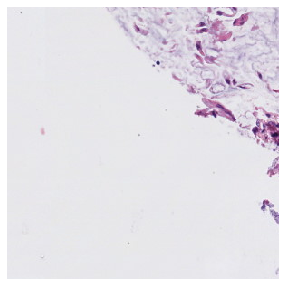

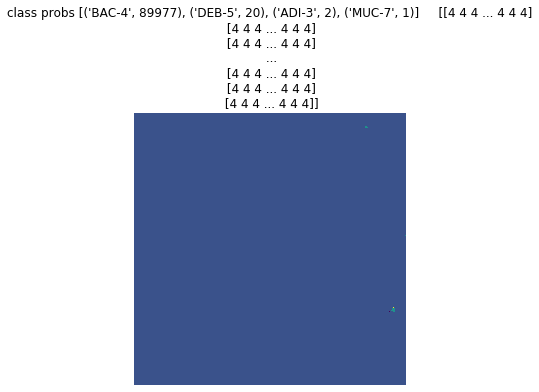

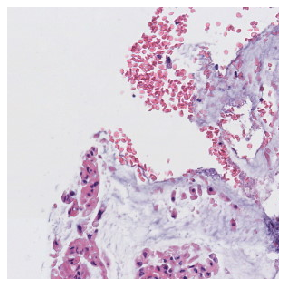

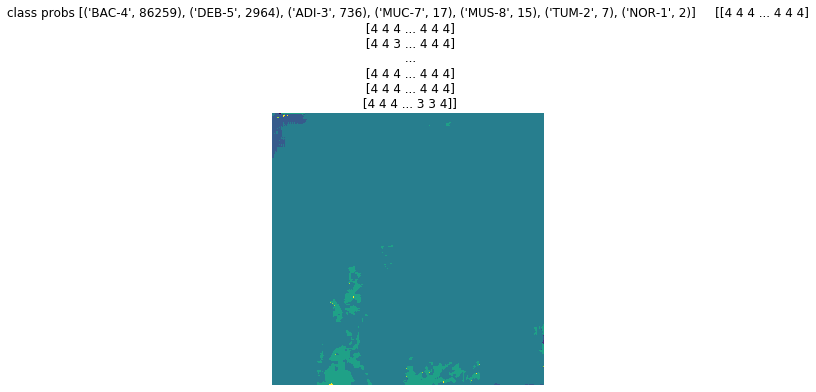

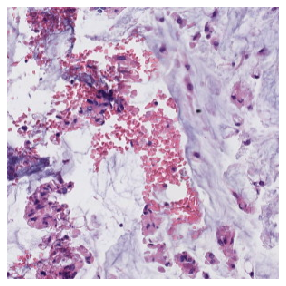

...

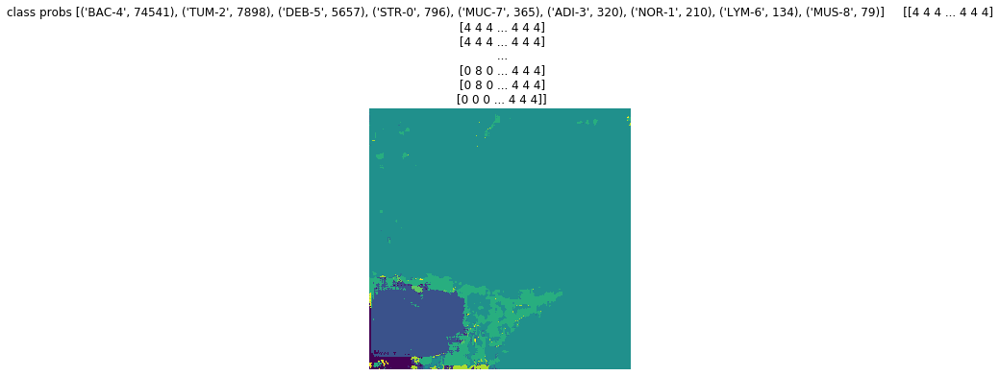

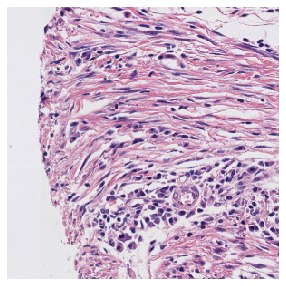

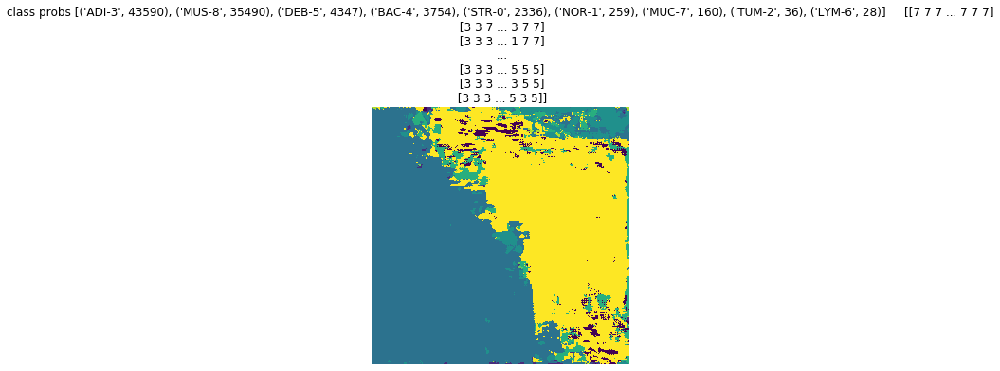

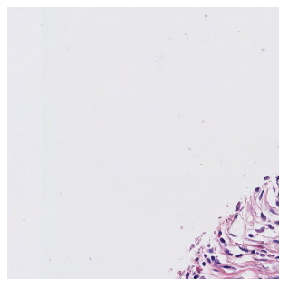

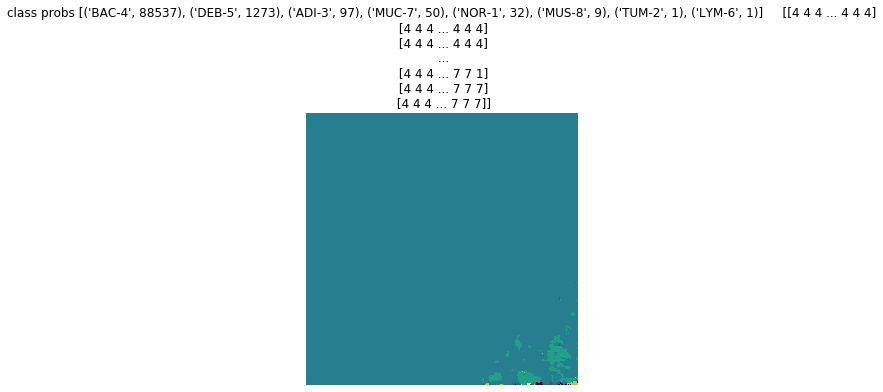

In [98]:
for i in range(0, sample.n):
    sample.dataset[i][0].show()
    s = np.unique(clas_idx[i].float(), return_counts=True)
    zipped = zip([f'{codes[int(j)]}-{int(j)}' for j in s[0]], s[1])
    tissues_ordered_by_count = sorted(zipped, key = lambda t: t[1], reverse = True)
    tit = f'probs {tissues_ordered_by_count}     {np.array(clas_idx[i])}'
    #codes[int(clas_{cx[i].float()}-{int(j)}.median())]
    show_image(clas_idx[i], title = f'class {tit}')

In [33]:
probs[0][1]

tensor([[0.0003, 0.0004, 0.0008,  ..., 0.0184, 0.0284, 0.0307],
        [0.0004, 0.0005, 0.0006,  ..., 0.0120, 0.0168, 0.0202],
        [0.0003, 0.0005, 0.0003,  ..., 0.0066, 0.0087, 0.0106],
        ...,
        [0.0257, 0.0180, 0.0492,  ..., 0.0020, 0.0017, 0.0045],
        [0.0170, 0.0094, 0.0180,  ..., 0.0038, 0.0039, 0.0062],
        [0.0191, 0.0097, 0.0142,  ..., 0.0060, 0.0044, 0.0120]])